In [1]:
import warnings
warnings.filterwarnings("ignore")

In [ ]:
import os
import glob
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
from PIL import Image
import matplotlib.animation as animation
from IPython.display import HTML

import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, Dataset
import torchvision.transforms as transforms
import torchvision.datasets as dset
import torchvision.utils as vutils

from model import Generator, Discriminator
from config import Config
from utils import weights_init
from dataset import MyDCGANDataset
from train import train


### Data visualization and defining dataset and dataloader

In [3]:
has_mps = torch.backends.mps.is_available() and torch.backends.mps.is_built()

config = Config()
config.dataroot = '/Users/simpleai/Desktop/DCGAN/dataset'
config.workers=0
config.device=torch.device("cuda:0" if (torch.cuda.is_available() and ngpu > 0) else "mps" if has_mps else "cpu")


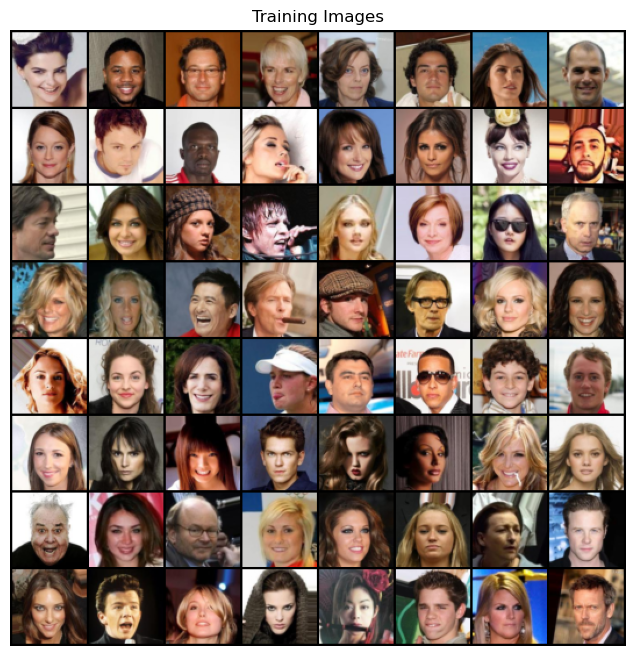

In [4]:
dataset = MyDCGANDataset(
    config, 
    transform=transforms.Compose([
        transforms.Resize(config.image_size),
        transforms.CenterCrop(config.image_size),
        transforms.ToTensor(),
        transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
        ]))


dataloader = DataLoader(dataset, batch_size=config.batch_size,
                        shuffle=True, num_workers=config.workers)

# Plot some training images
real_batch = next(iter(dataloader))
plt.figure(figsize=(8,8))
plt.axis("off")
plt.title("Training Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(config.device)[:64], padding=2, normalize=True).cpu(),(1,2,0)))
plt.show()
                        

### Instantiating the Generator and initializing it's weights

In [5]:
# Instantiate the Generator
netG = Generator(config).to(config.device)

# Handle multigpu 
if (config.device.type == 'cuda') and (config.ngpu > 1):
    netG = nn.DataParallel(netG, list(range(config.ngpu)))

# Apply the weights initialization function to the generator
netG.apply(weights_init)

# print the model
print(netG)

Generator(
  (main): Sequential(
    (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace=True)
    (12): ConvTranspose2d(64, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (13): Tanh()
  )
)


### Instantiating the Discriminator and initializing it's weights

In [6]:
# Instantiate the Discriminator
netD = Discriminator(config).to(config.device)

# Handle multigpu 
if (config.device.type == 'cuda') and (config.ngpu > 1):
    netD = nn.DataParallel(netD, list(range(config.ngpu)))

# Apply the weights initialization function to the discriminator
netD.apply(weights_init)

# print the model
print(netD)



Discriminator(
  (main): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (6): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (9): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): LeakyReLU(negative_slope=0.2, inplace=True)
    (11): Conv2d(512, 1, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (12): Sigmoid()
  )
)


### Loss function and optimizers

In [7]:
# binary cross entropy loss satisfies the definition of the loss function that is
# described in the paper. 
# the formula is: 
#    loss(D(x)) = -log(D(x))
#    loss(D(G(z))) = -log(1 - D(G(z)))
#    loss(G) = -log(D(G(z)))

criterion = nn.BCELoss()

# Create batch of latent vectors that we will use to visualize the progression
# of the generator
fixed_noise = torch.randn(64, config.nz, 1, 1, device=config.device)

# Establish convention for real and fake labels during training
real_label = 1.
fake_label = 0.

# Setup Adam optimizers for both G and D
optimizerD = optim.Adam(netD.parameters(), lr=config.lr, betas=(config.beta1, 0.999))
optimizerG = optim.Adam(netG.parameters(), lr=config.lr, betas=(config.beta1, 0.999))



## Training the descrimantor

* Goal is to train a discriminator to maximize the probability of correctly classifying a given input as real or fake
* Training the discriminator happens in three steps:
1. Passing a batch of real images to the discriminator, caluclating their loss by ($log(D(x))$), then calculating the gradients in a backward pass
2. constructing a batch of fake samples with the current generator, forward passing them into the discriminator, caluclating the loss by ($log(1-D(G(z)))$) and *accumulating* the gradients with another backward pass.
3. Now, a step of the discriminator's optimizer will be called

In [ ]:
netD, netG, G_losses, D_losses = train(
    config, netG, netD, criterion, optimizerG, optimizerD, dataloader, fixed_noise
)

## Using the trained generator to make multiple new fake images and using the discriminator to see which ones are being detected by the model as fake and which ones are seen as real omages

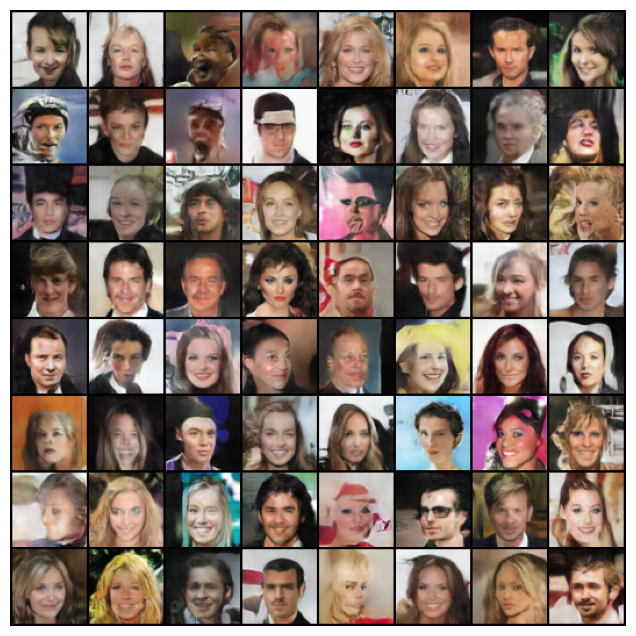

In [39]:
img_list = []
# generating 10 oiteration of fixed noises
for i in range(10):
    # makign new noise for image generation
    fixed_noise = torch.randn(64, config.nz, 1, 1, device=config.device)

    # using the fixed noise ad input to the generator to make new images
    fake = netG(fixed_noise).detach().cpu()

    # feeding the images to the discriminator to assess the fake/real identity of the images (We know all images are fake)
    fake_id = netD(fake.to(config.device)).detach().cpu()
    fake_id = (fake_id.view(-1)>0.5).numpy().astype(np.uint)

    # recording the images
    img_list.append(vutils.make_grid(fake, padding=2, normalize=True))


# plot image generation
fig = plt.figure(figsize=(8,8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)

HTML(ani.to_jshtml())
